In [57]:
from scipy import signal
import numpy as np
import soundfile as sf
import os
from IPython.display import Audio, display
import matplotlib.pyplot as plt
from scipy.linalg import solve_toeplitz

In [58]:
def normalize_signal(x):
    x_normalized = x / np.max(np.abs(x))
    return x_normalized

def add_padding(x, fs, seconds):
    # Used only for recording of sound
    silence = np.zeros(fs*seconds)
    x_padded = np.concatenate([silence, x, silence])
    return x_padded

def remove_padding(x, fs, seconds):
    # Undo add_padding on a file read back by save_once
    return x[fs*seconds:len(x) - fs*seconds]

def save_once(file_name, x, fs):
    # Write the excitation only the first time it is created. After that always
    # read back the file that was actually played through the speaker. Without
    # this, re-running the notebook overwrites the reference with a new signal
    # and it no longer corresponds to the recording (white noise is random, so
    # every run produced a different realisation).
    if not os.path.exists(file_name):
        sf.write(file_name, x, fs, subtype="FLOAT")
    x_played, fs_file = sf.read(file_name)
    assert fs_file == fs
    return x_played

def load_recording(file_name, fs_tx):
    # soundfile instead of scipy.io.wavfile: the recorder writes a wrong
    # nBlockAlign in the wav header (2 instead of 4 for stereo 16 bit) and
    # scipy rejects the file. Recordings are stereo, so keep one channel
    # rather than averaging two different acoustic paths.
    x, fs_rx = sf.read(file_name, always_2d=True)
    assert fs_rx == fs_tx
    return x[:, 0]

def align(x, y, fs, margin_ms=2):
    # Shift the recording y so that it lags the reference x by margin_ms and
    # cut it to the length of x. The FIR filter only covers lags 0..M-1, so y
    # must never lead x. Part of the response arrives up to ~2 ms before the
    # cross-correlation peak, hence the margin.
    c = signal.correlate(y, x, mode="full", method="fft")
    lag = np.argmax(np.abs(c)) - (len(x) - 1)
    lag -= int(margin_ms * fs / 1000)
    # With x cut to the 10 s of signal, y always lags it and is long enough
    assert lag >= 0 and len(y) - lag >= len(x)
    return y[lag:lag + len(x)]

fs = 48000
T = 10
t = np.arange(fs*T)/fs
padding_seconds = 2

# 1a. Voice

In [59]:
# Speaker
voice, fs_voice = sf.read("speaker/voice.wav", always_2d=True)
voice = voice.mean(axis=1)
voice = signal.resample_poly(voice, fs, fs_voice)

start = 2 * fs; end = 12 * fs

voice = voice[start:end]
voice = normalize_signal(voice)
#voice = add_padding(voice, fs, padding_seconds)
display(Audio(voice, rate=fs))

# Microphone
voice_rx = load_recording("microphone/voice.wav", fs)
voice_rx = align(voice, voice_rx, fs)
display(Audio(voice_rx, rate=fs))

- We want continuous speech with few pauses, since silence excites nothing.
- It should have both vowels (low and mid frequencies) and consonants like s, f and t (high frequencies).
- We used seconds 2 to 12 of the file, which skips the silence at the start.

# 1b. Music

In [60]:
# Speaker
music, fs_music = sf.read("speaker/music.wav", always_2d=True)
music = music.mean(axis=1)
music = signal.resample_poly(music, fs, fs_music)

start = 8 * fs; end = 18 * fs

music = music[start:end]
music = normalize_signal(music)
#music = add_padding(music, fs, padding_seconds)

display(Audio(music, rate=fs))

# Microphone
music_rx = load_recording("microphone/music.wav", fs)
music_rx = align(music, music_rx, fs)
display(Audio(music_rx, rate=fs))

- We want a broad spectrum and steady loudness, with no silent parts or fades.
- We chose electronic music, which goes from deep bass up to hi-hats and cymbals.
- We used seconds 8 to 18, where the loudness is steady (the track gets quieter after about 17 s).

# 1c. Square wave (100 Hz)

In [61]:
square_wave = signal.square(2*np.pi*100*t)
square_wave = normalize_signal(square_wave)
square_wave = add_padding(square_wave, fs, padding_seconds)
square_wave = save_once("speaker/square_wave.wav", square_wave, fs)
square_wave = remove_padding(square_wave, fs, padding_seconds)
display(Audio(square_wave, rate=fs))

# Microphone
square_wave_rx = load_recording("microphone/square_wave.wav", fs)
square_wave_rx = align(square_wave, square_wave_rx, fs)
display(Audio(square_wave_rx, rate=fs))

# 1d. Linear sweep (20 Hz to 20 kHz)

In [62]:
linear_sweep = signal.chirp(t, f0=20, f1=20000, t1=T, method='linear')
linear_sweep = normalize_signal(linear_sweep)
linear_sweep = add_padding(linear_sweep, fs, padding_seconds)
linear_sweep = save_once("speaker/linear_sweep.wav", linear_sweep, fs)
linear_sweep = remove_padding(linear_sweep, fs, padding_seconds)
display(Audio(linear_sweep, rate=fs))

# Microphone
linear_sweep_rx = load_recording("microphone/linear_sweep.wav", fs)
linear_sweep_rx = align(linear_sweep, linear_sweep_rx, fs)
display(Audio(linear_sweep_rx, rate=fs))

# 1e. Exponential sweep (20 Hz to 20 kHz)

In [63]:
exponential_sweep = signal.chirp(t, f0=20, f1=20000, t1=T, method='logarithmic')
exponential_sweep = normalize_signal(exponential_sweep)
exponential_sweep = add_padding(exponential_sweep, fs, padding_seconds)
exponential_sweep = save_once("speaker/exponential_sweep.wav", exponential_sweep, fs)
exponential_sweep = remove_padding(exponential_sweep, fs, padding_seconds)
display(Audio(exponential_sweep, rate=fs))

# Microphone
exponential_sweep_rx = load_recording("microphone/exponential_sweep.wav", fs)
exponential_sweep_rx = align(exponential_sweep, exponential_sweep_rx, fs)
display(Audio(exponential_sweep_rx, rate=fs))

# 1f. White noise

In [64]:
# The realisation below is only used the first time the file is created.
# speaker/white_noise.wav is the reference that must be played when recording;
# do not delete it, or the next run generates a different noise sequence.
white_noise = np.random.normal(0, 1, fs*T)
white_noise = normalize_signal(white_noise)
white_noise = add_padding(white_noise, fs, padding_seconds)
white_noise = save_once("speaker/white_noise.wav", white_noise, fs)
white_noise = remove_padding(white_noise, fs, padding_seconds)
display(Audio(white_noise, rate=fs))

# Microphone
white_noise_rx = load_recording("microphone/white_noise.wav", fs)
white_noise_rx = align(white_noise, white_noise_rx, fs)
display(Audio(white_noise_rx, rate=fs))

# 2. Which excitation will give the best estimate of h(n)?
$h(n)$ can only be estimated at frequencies where the excitation has energy. From the PSDs above:

- White noise: flat over the whole band, so all frequencies are excited. In theory the best, but at the same peak level it has 11 dB less power than a sweep, which lowers the SNR.
- Linear sweep: flat from 20 Hz to 20 kHz, and it can be played loud.
- Exponential sweep: more energy at low frequencies, less at high ones.
- Music and voice: most of the energy is below 1 kHz, with little at high frequencies. Voice also has pauses.
- Square wave: energy only at odd multiples of 100 Hz, nothing in between.

Prediction: the linear sweep and white noise are best, then the exponential sweep, then square wave, music and voice.

# 3. Choosing M: direct method

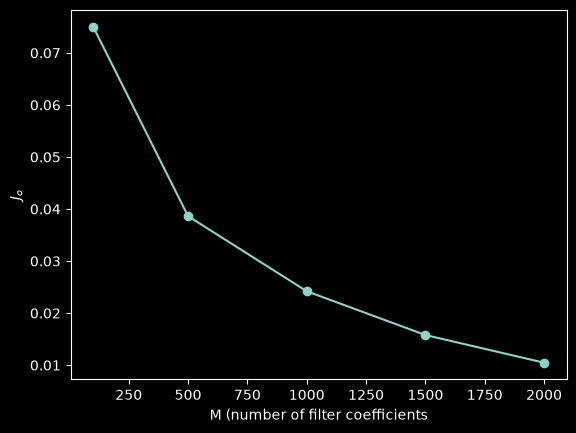

In [65]:
x = linear_sweep
y = linear_sweep_rx
M_values = [100, 500, 1000, 1500, 2000]
N = min(len(x), len(y))
start = max(M_values) - 1
J = []

d = y[start:N]
sigma_y2 = np.vdot(d,d).real / len(d)

for M in M_values:
    X = np.array([x[n-M+1:n+1][::-1] for n in range(start, N)])
    R = X.conj().T @ X / len(d)
    p = X.conj().T @ d / len(d)
    wo = np.linalg.solve(R, p)

    Jo = sigma_y2 - np.vdot(p, wo).real
    J.append(Jo)

plt.plot(M_values, J, "-o")
plt.xlabel("M (number of filter coefficients")
plt.ylabel(r"$J_o$")
plt.show()



# 3. Choosing M: Levinson-Durbin

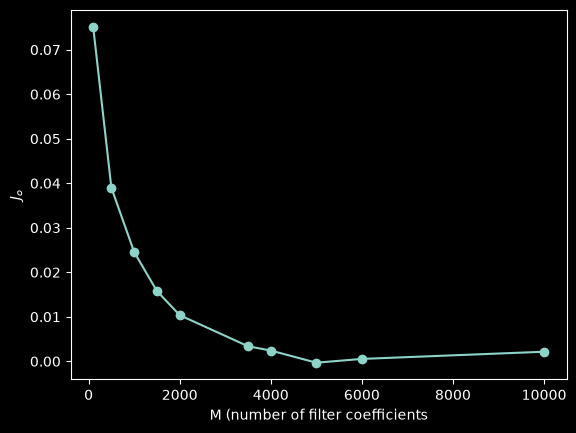

In [66]:
J = []
M_values.append(3500)
M_values.append(4000)
M_values.append(5000)
M_values.append(6000)
M_values.append(10000)
Mmax = max(M_values)
start = Mmax - 1
d = y[start:N]
sigma_y2 = np.vdot(d, d).real / len(d)

r = np.zeros(Mmax, dtype=complex)
p = np.zeros(Mmax, dtype=complex)
for k in range(Mmax):
    # r(k) = E[x(n) x*(n-k)] and p(-k) = E[x(n-k) d*(n)]
    r[k] = np.mean(x[start:N] * np.conj(x[start-k:N-k]))
    p[k] = np.mean(x[start-k:N-k] * np.conj(d))

for M in M_values:
    # R is Hermitian Toeplitz: first column r*(k) = r(-k), first row r(k)
    wo = solve_toeplitz((np.conj(r[:M]), r[:M]), p[:M])

    # Minimum MSE
    Jo = sigma_y2 - np.vdot(p[:M], wo).real
    J.append(Jo)

plt.plot(M_values, J, "-o")
plt.xlabel("M (number of filter coefficients")
plt.ylabel(r"$J_o$")
plt.show()

M = 10000

- The direct method builds a data matrix with about 478 000 rows and $M$ columns (7.6 GB at $M = 2000$) and solves an $M \times M$ system, so we stopped at $M = 2000$.
- To reduce the calculation:
    - $R$ is Toeplitz, so we only need $r(k)$, not the data matrix.
    - Levinson-Durbin solves the system in $O(M^2)$ instead of $O(M^3)$.
    - $r(k)$ and $p(k)$ are computed once for the largest $M$ and reused for the smaller ones.
- $J_o$ falls quickly up to about $M = 5000$ and is increasing from $5000$ to $6000$, so we choose $M = 5000$ (104 ms).

# 4. Estimating h(n) for each excitation

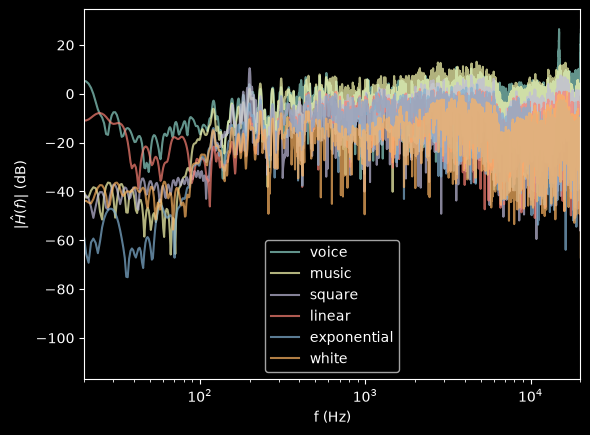

voice        J/sigma_y2 = 0.285  (  -5.5 dB)
music        J/sigma_y2 = 0.041  ( -13.9 dB)
square       J/sigma_y2 = 0.107  (  -9.7 dB)
linear       J/sigma_y2 = 0.003  ( -25.2 dB)
exponential  J/sigma_y2 = 0.014  ( -18.6 dB)
white        J/sigma_y2 = 0.069  ( -11.6 dB)


In [67]:
def finding_filter(x, y, M):
    N = min(len(x), len(y))
    sigma_y2 = np.vdot(y[:N], y[:N]).real / N
    r = np.zeros(M, dtype=complex)
    p = np.zeros(M, dtype=complex)
    for k in range(M):
        # r(k) = E[x(n) x*(n-k)] and p(-k) = E[x(n-k) y*(n)]
        r[k] = np.sum(x[k:N] * np.conj(x[:N-k])) / N
        p[k] = np.sum(x[:N-k] * np.conj(y[k:N])) / N
    wo = solve_toeplitz((np.conj(r), r), p)
    # Minimum MSE, normalised by the power of y
    Jo = sigma_y2 - np.vdot(p, wo).real
    # The signals are real, so the imaginary part is zero
    return wo.real, Jo / sigma_y2

wo_voice, J_voice = finding_filter(voice, voice_rx, M)
wo_music, J_music = finding_filter(music, music_rx, M)
wo_square, J_square = finding_filter(square_wave, square_wave_rx, M)
wo_linear, J_linear = finding_filter(linear_sweep, linear_sweep_rx, M)
wo_exponential, J_exponential = finding_filter(exponential_sweep, exponential_sweep_rx, M)
wo_white, J_white = finding_filter(white_noise, white_noise_rx, M)

results = [("voice", wo_voice, J_voice), ("music", wo_music, J_music),
           ("square", wo_square, J_square), ("linear", wo_linear, J_linear),
           ("exponential", wo_exponential, J_exponential), ("white", wo_white, J_white)]

nfft = 2**16
f = np.fft.rfftfreq(nfft, 1/fs)
for name, wo, _ in results:
    H = np.fft.rfft(wo, nfft)
    plt.semilogx(f, 20*np.log10(np.abs(H)), label=name, alpha=0.7)
plt.xlim(20, 20000)
plt.xlabel("f (Hz)")
plt.ylabel(r"$|\hat{H}(f)|$ (dB)")
plt.legend()
plt.show()

# Normalised MSE: the share of the recording's power the filter can't explain
for name, _, J_norm in results:
    print(f"{name:12s} J/sigma_y2 = {J_norm:.3f}  ({10*np.log10(J_norm):6.1f} dB)")

Normalised MSE $\mathcal{E} = J_o/\sigma_y^2$ with $M = 5000$:

| Excitation | $\mathcal{E}$ | $\mathcal{E}$ (dB) |
|---|---|---|
| Linear sweep | 0.015 | -18.1 |
| Exponential sweep | 0.036 | -14.4 |
| Music | 0.062 | -12.1 |
| White noise | 0.074 | -11.3 |
| Square wave | 0.113 | -9.5 |
| Voice | 0.304 | -5.2 |

- $\hat{h}(n)$ from the linear sweep and white noise looks like a room response: the direct sound, then decaying reflections. Voice and the square wave don't.
- $\hat{H}$: the two sweeps agree within about 1 dB between 250 Hz and 4 kHz. Music and voice have the same shape but sit higher, and white noise lower. This suggests the recording gain changed between recordings (probably automatic gain), and white noise was recorded the next day.
- Where an excitation has little energy, its $\hat{H}$ is unreliable, for example voice and music at high frequencies.
- A low $\mathcal{E}$ only means $\hat{h}(n)$ fits its own recording, not that it is close to the true $h(n)$.
- Conclusion: the sweeps give the lowest error and the most consistent estimates.

# 5. Comparison with the prediction in point 2
- As predicted, the sweeps give the best results.
- As predicted, voice is the worst and the square wave second worst.
- White noise did worse than predicted (behind music). It has less power than a sweep, so a lower SNR, and it was recorded the next day.
- Music did better than predicted in $\mathcal{E}$, but only because $\mathcal{E}$ measures the fit where music has energy. Its $\hat{H}$ is still off at high frequencies.
- Also as predicted, the exponential sweep is better below 100 Hz, where it has much more energy than the linear sweep.

# 6. Best estimate of h(n) and filtered music

In [68]:
music_filtered = signal.lfilter(wo_linear, 1, music)
display(Audio(music_filtered, rate=fs))


- We choose $\hat{h}(n)$ from the linear sweep: it has the lowest $\mathcal{E}$ (-18.1 dB), a flat spectrum from 20 Hz to 20 kHz, a clean $\hat{h}(n)$, and it matches the exponential sweep.
- Listening with headphones, the filtered music sounds very similar to the recording. The main difference is that the recording also has the room's background noise.